In [4]:
#import Library

from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt

Cek sampel data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
dir_path = '/content/drive/MyDrive/TB_Chest_Radiography_Database'

Subset: Normal
Index: 1
File name: Normal-1.png
Mode: RGB
Size: (512, 512)


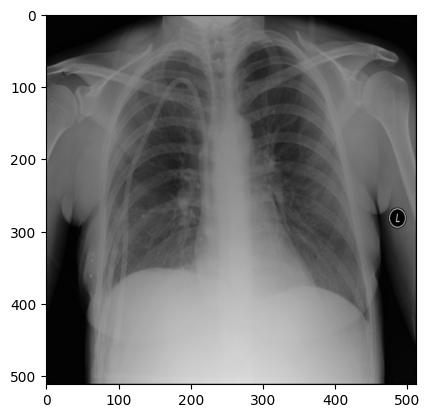

Index: 2
File name: Normal-2.png
Mode: RGB
Size: (512, 512)


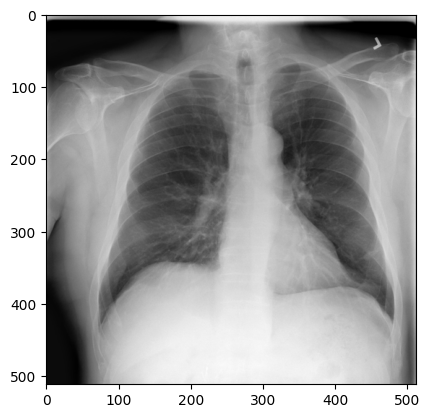

Index: 3
File name: Normal-3.png
Mode: RGB
Size: (512, 512)


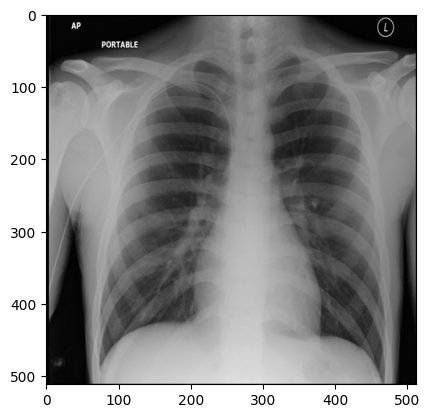

Subset: Tuberculosis
Index: 1
File name: Tuberculosis-1.png
Mode: RGB
Size: (512, 512)


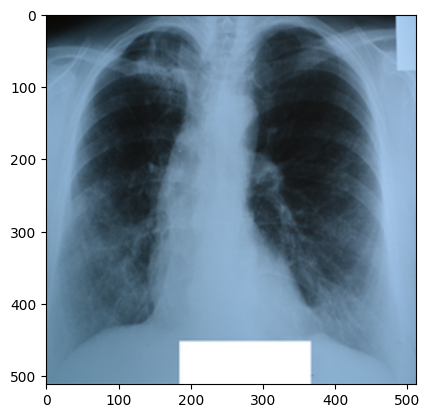

Index: 2
File name: Tuberculosis-2.png
Mode: RGB
Size: (512, 512)


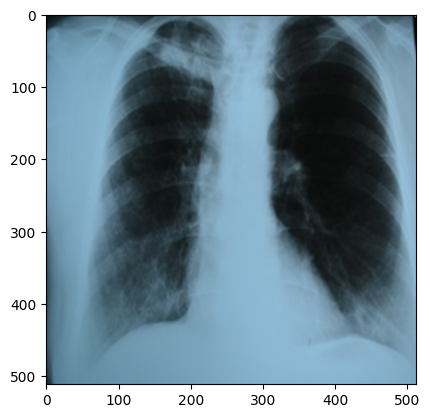

Index: 3
File name: Tuberculosis-3.png
Mode: RGB
Size: (512, 512)


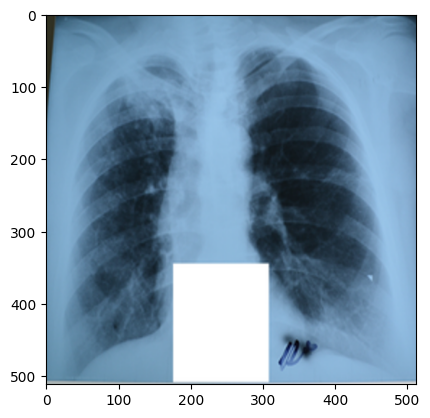

In [6]:
for subset in ['Normal','Tuberculosis']:
    prefix_bold = "\033[1m"
    suffix_bold = "\033[0m"
    print(f"{prefix_bold}Subset: {subset}{suffix_bold}")

    # range(start, stop, step)
    for i in range(1,4):

        image = Image.open(
            f"{dir_path}/{subset}/{subset}-{i}.png")
        print(f"Index: {i}")
        print(f"File name: {subset}-{i}.png")
        print(f"Mode: {image.mode}")
        print(f"Size: {image.size}")
        plt.imshow(image)
        plt.show()

In [7]:
#import other libraries
import os
from tqdm import tqdm
import pandas as pd
import numpy as np

Data Check Up - mengeksplorasi dimensi dan informasi gambar dari raw data

In [8]:
def Image_info_checker(subset, dir_path):
    image_dir = os.path.join(dir_path, subset)
    image_files = os.listdir(image_dir)
    image_count = len(image_files)

    data = []

    for i in tqdm(range(1, image_count), desc='Checking...'):
        image_path = os.path.join(image_dir, f'{subset}-{i}.png')
        image = Image.open(image_path)

        img_name = f'{subset}-{i}.png'
        img_mode = image.mode
        img_size = image.size
        img_format = image.format
        img_channels = image.getbands()
        img_histogram = tuple(image.histogram()) # Convert to tuple for to use with "Plot", Because "image.histogram()"" will return as a list
        img_mean = np.mean(image)
        img_std = np.std(image)

        data.append({'image_name': img_name, 'mode': img_mode, 'size': img_size, 'format': img_format,
                     'channels': img_channels, 'histogram': img_histogram, 'mean': img_mean, 'std': img_std, 'image_path': image_path})

    # Convert data to DataFrame
    df = pd.DataFrame(data)
    def summary(df, subset, dir_path):
        print(f"{prefix_bold}Directory path{suffix_bold}: {dir_path}")
        print(f"{prefix_bold}Subset{suffix_bold}: {subset}")
        print(f"{prefix_bold}Size{suffix_bold}:\n")
        print(df['size'].value_counts().to_string(header=False))
        print(f"\n{prefix_bold}Format{suffix_bold}:\n")
        print(df['format'].value_counts().to_string(header=False))
        print(f"\n{prefix_bold}Mode{suffix_bold}:\n")
        print(df['mode'].value_counts().to_string(header=False))
        print(f"\n{prefix_bold}Mean{suffix_bold}: {df['mean'].mean()}")
        print(f"{prefix_bold}Std.{suffix_bold}: {df['std'].std()}")
    summary(df, subset, image_dir)
    return df

Normal Subset - pengelompokan untuk data normal

In [9]:
dir_path = '/content/drive/MyDrive/TB_Chest_Radiography_Database'
normal_df = Image_info_checker(subset='Normal', dir_path=dir_path)

Checking...: 100%|██████████| 3500/3500 [01:12<00:00, 48.28it/s]

Directory path: /content/drive/MyDrive/TB_Chest_Radiography_Database/Normal
Subset: Normal
Size:

(512, 512)    3500

Format:

PNG    3500

Mode:

RGB    3500

Mean: 130.12328073120116
Std.: 9.90307293659762


In [10]:
normal_df.head(3)

,image_name,mode,size,format,channels,histogram,mean,std,image_path
0,Normal-1.png,RGB,"(512, 512)",PNG,"(R, G, B)","(218, 143, 3758, 12477, 2452, 1582, 1221, 682,...",102.364891,53.606645,/content/drive/MyDrive/TB_Chest_Radiography_Da...
1,Normal-2.png,RGB,"(512, 512)",PNG,"(R, G, B)","(3355, 434, 266, 283, 340, 265, 394, 711, 1381...",139.430801,65.014435,/content/drive/MyDrive/TB_Chest_Radiography_Da...
2,Normal-3.png,RGB,"(512, 512)",PNG,"(R, G, B)","(1866, 176, 193, 1497, 6090, 5735, 2442, 1844,...",109.339588,55.383087,/content/drive/MyDrive/TB_Chest_Radiography_Da...


In [11]:
normal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image_name  3500 non-null   object 
 1   mode        3500 non-null   object 
 2   size        3500 non-null   object 
 3   format      3500 non-null   object 
 4   channels    3500 non-null   object 
 5   histogram   3500 non-null   object 
 6   mean        3500 non-null   float64
 7   std         3500 non-null   float64
 8   image_path  3500 non-null   object 
dtypes: float64(2), object(7)
memory usage: 246.2+ KB


Tuberculosis Subset - pengelompokan untuk data TB

In [12]:
tb_df = Image_info_checker(subset='Tuberculosis', dir_path=dir_path)

Checking...: 100%|██████████| 699/699 [00:16<00:00, 43.45it/s]

Directory path: /content/drive/MyDrive/TB_Chest_Radiography_Database/Tuberculosis
Subset: Tuberculosis
Size:

(512, 512)    699

Format:

PNG    699

Mode:

RGB    391
L      308

Mean: 126.29666240475665
Std.: 15.023822497039555


In [13]:
tb_df.head(3)

,image_name,mode,size,format,channels,histogram,mean,std,image_path
0,Tuberculosis-1.png,RGB,"(512, 512)",PNG,"(R, G, B)","(0, 0, 0, 0, 0, 0, 0, 0, 0, 12, 196, 314, 193,...",122.455050,61.344179,/content/drive/MyDrive/TB_Chest_Radiography_Da...
1,Tuberculosis-2.png,RGB,"(512, 512)",PNG,"(R, G, B)","(0, 0, 0, 0, 4, 10, 3, 3, 5, 5, 283, 1473, 218...",111.781446,61.594115,/content/drive/MyDrive/TB_Chest_Radiography_Da...
2,Tuberculosis-3.png,RGB,"(512, 512)",PNG,"(R, G, B)","(2, 1, 2, 5, 5, 5, 6, 4, 3, 6, 9, 13, 12, 16, ...",139.624195,63.129705,/content/drive/MyDrive/TB_Chest_Radiography_Da...


Image Distribution - mengeksplorasi distribusi gambar, antara yang normal dan yang TB

In [14]:
def plot_image_and_histogram(subset, index, title = 'Image and Histogram'):
    # Load the image
    image = Image.open(f"{dir_path}/{subset}/{subset}-{index}.png")

    # Check if the image is grayscale (mode 'L')
    if image.mode == 'L':
        # Create subplots with 1 row and 2 columns
        fig, axs = plt.subplots(1, 2, figsize=(12, 6))

        # Plot the image in the first column
        axs[0].imshow(image, cmap='gray')
        sub_title = f"""Image\n
        Index: {index},
        File name: {subset}-{index}.png,
        Mode: {image.mode},
        Size: {image.size}
        """
        axs[0].set_title(sub_title, loc='left')

        # Plot the histogram for the grayscale image in the second column
        axs[1].hist(image.getdata(), bins=256, color='gray', alpha=0.5, label='Gray', histtype='step')
        axs[1].set_xlabel('Intensity')
        axs[1].set_ylabel('Frequency')
        axs[1].set_title('Histogram of the Grayscale Image')
         # Add big title
        fig.suptitle(title, fontsize=16, fontweight='bold')
        # Adjust layout to prevent overlap
        plt.tight_layout()
        plt.show()
    else:
        # For RGB images, split channels and plot as before
        r, g, b = image.split()
        fig, axs = plt.subplots(1, 2, figsize=(15, 6))
        axs[0].imshow(image)
        sub_title = f"""Image\n
        Index: {index},
        File name: {subset}-{index}.png,
        Mode: {image.mode},
        Size: {image.size}
        """
        axs[0].set_title(sub_title, loc='left')
        axs[1].hist(r.getdata(), bins=256, color='red', alpha=0.5, label='Red', histtype='step')
        axs[1].hist(g.getdata(), bins=256, color='green', alpha=0.5, label='Green', histtype='step')
        axs[1].hist(b.getdata(), bins=256, color='blue', alpha=0.5, label='Blue', histtype='step')
        axs[1].set_xlabel('Intensity')
        axs[1].set_ylabel('Frequency')
        axs[1].set_title('Histogram of the Image Channels')
        axs[1].legend()
         # Add big title
        fig.suptitle(title, fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()

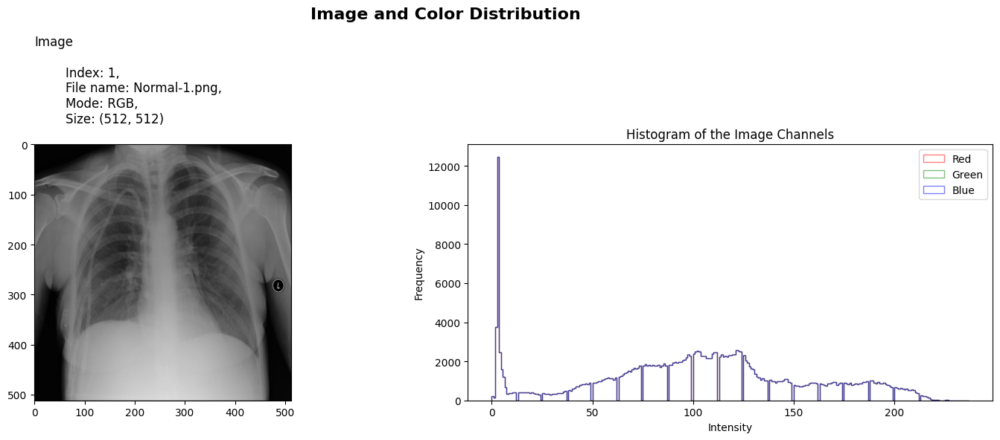

In [15]:
# Usage example:
plot_image_and_histogram(subset= 'Normal',
                         index=1,
                         title = "Image and Color Distribution")

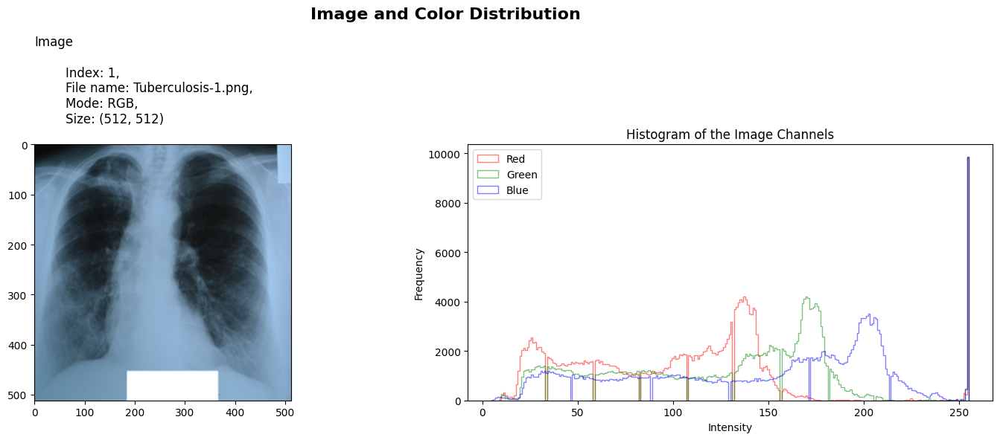

In [16]:
# Usage example:
plot_image_and_histogram(subset= 'Tuberculosis',
                         index=1,
                         title = "Image and Color Distribution")

Mulai Preprocessing Data

Pertama-tama dengan mengubah file Image dari foto XRay menjadi bentuk array NumPy

In [17]:
import numpy as np
from numpy import asarray
import os
from tqdm import tqdm

In [19]:
def numpize(subset: str, label: int, img_size=(128, 128), grayscale=False):
    image_dir = f'{dir_path}/{subset}/'
    image_files = os.listdir(image_dir)
    image_count = len(image_files)
    transformed_images = []
    labels = []
    for i in tqdm(range(1, image_count), desc='Transforming...'):
        image_path = f'{image_dir}/{subset}-{i}.png'
        image = Image.open(image_path)

        # Ensure all images are in the same format
        if grayscale:
            image = image.convert('L')  # Convert to grayscale
        else:
            image = image.convert('RGB')  # Convert to RGB

        # Resize all images to the specified size without padding
        resized_image = image.resize(img_size)
        data = np.asarray(resized_image)
        # Achieve into list
        transformed_images.append(data)
        labels.append(label)

    images_numpy_array = np.array(transformed_images)
    labels_numpy_array = np.array(labels)
    return images_numpy_array, labels_numpy_array

Transformasi data Normal

In [20]:
x_norm, y_norm = numpize(subset='Normal',
               label = 0,
               img_size=(128, 128),
               grayscale=False)
x_norm.shape

Transforming...: 100%|██████████| 3500/3500 [02:13<00:00, 26.18it/s]


(3500, 128, 128, 3)

In [21]:
y_norm.shape

(3500,)

Transformasi Data Tuberculosis

In [22]:
x_tb, y_tb = numpize(subset='Tuberculosis',
             label = 1,
             img_size=(128, 128),
             grayscale=False)
x_tb.shape

Transforming...: 100%|██████████| 699/699 [00:15<00:00, 45.05it/s]


(699, 128, 128, 3)

In [23]:
y_tb.shape

(699,)

In [24]:
def show_image(images, target, title, num_display=16, num_cols=4, cmap='gray', random_mode=False):
  # Determine the number of rows based on the num_cols parameter
    n_cols = min(num_cols, num_display)
    n_rows = int(np.ceil(num_display / n_cols))

    n_images = min(num_display, len(images))
    if random_mode:
        if num_display > n_images:
            print("Warning: num_display exceeds the number of available images. Setting num_display to the number of available images.")
            num_display = n_images
        random_indices = np.random.choice(
            n_images, num_display, replace=False)
    else:
        num_display = min(num_display, n_images)
        random_indices = np.arange(num_display)

    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols, figsize=(17, 4*n_rows))
    for i, ax in enumerate(axes.flatten()):
        index = random_indices[i]
        if i >= n_images:  # Check if the index exceeds the available number of images
            break
        else:
            image = images[index]

        ax.imshow(image, cmap=cmap)
        ax.set_title("Target: {}".format(target[index]))

        # Add image index as text
        ax.text(0.5, -0.2, f'Image Index: {index}', transform=ax.transAxes,
                fontsize=7, ha='center')

    plt.suptitle(f"{title} (Displaying {num_display} Images)",
                 fontsize=16, fontweight='bold')

    fig.set_facecolor('white')
    plt.tight_layout()
    return plt.show()

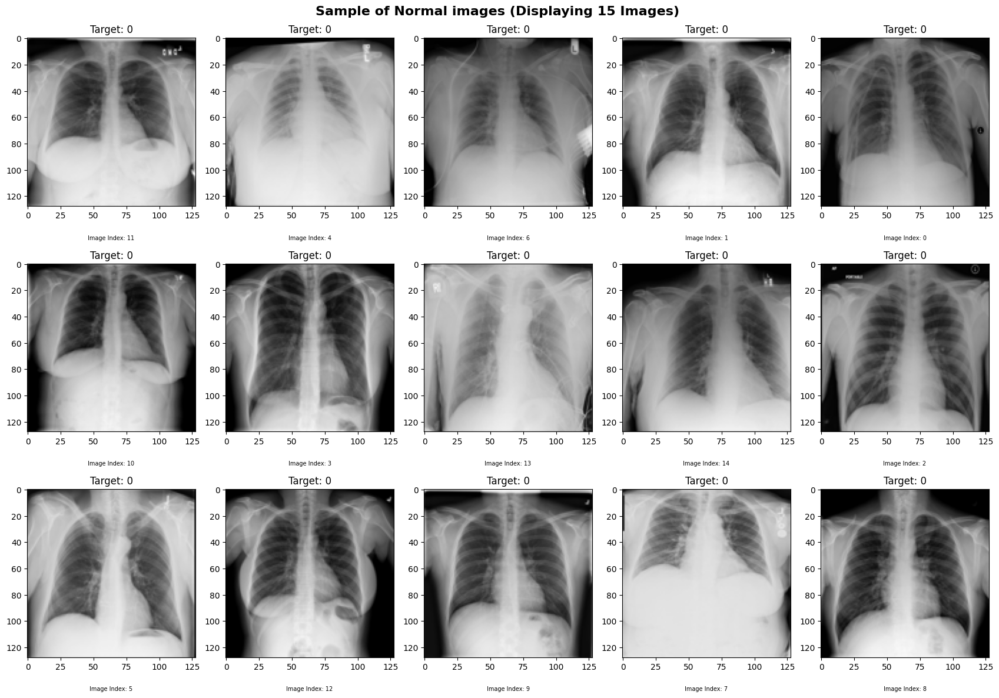

In [25]:
show_image(images=x_norm,
           target=y_norm,
           title='Sample of Normal images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=True)

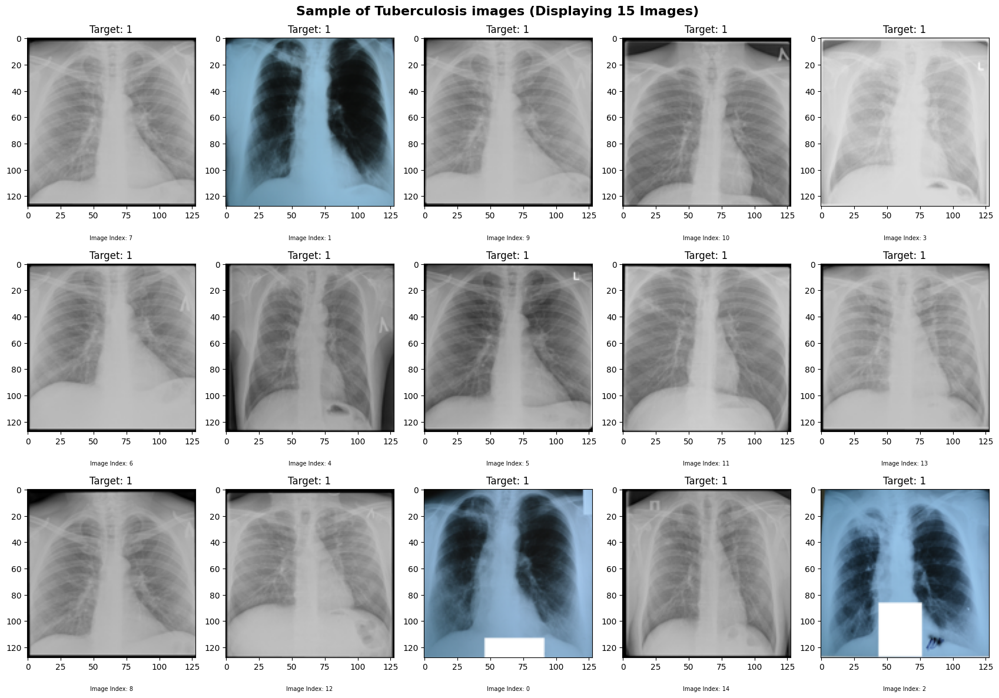

In [26]:
show_image(images=x_tb,
           target=y_tb,
           title='Sample of Tuberculosis images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=True)

Image Cropping - supaya bisa lebih efisien dalam pengelompokan machine learning, dengan meremove blank space dari data

In [27]:
from skimage import img_as_float
from skimage import exposure

In [28]:
def plot_gray_scale_histogram(images, titles, bins=55):
    # Display results
    fig, axes = plt.subplots(2, len(images), figsize=(17, 8))

    for i, (title, image) in enumerate(zip(titles, images)):
        ax_img, ax_hist, ax_cdf, random_index = img_and_hist(
            image, axes[:, i], bins)

        mean_value = np.mean(image)
        median = np.median(image)
        percentile_95 = np.percentile(image, 95)
        std_value = np.std(image)
        min_value = np.min(image)
        max_value = np.max(image)

        ax_img.set_title('Descriptive statistics of '+r'$\bf{' + f'{title}'+'}$' +
                         f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Median: {median: .2f},\nPercentile 95: {percentile_95: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=16)
        ax_img.text(0.5, -0.15, f'Image Index: {random_index}\n(Display random image)', transform=ax_img.transAxes,
                    fontsize=10, ha='center')

        y_min, y_max = ax_hist.get_ylim()
        ax_hist.set_title(
            'Distribution of pixel intensities of'+r'$\bf{' + f'{title}'+'}$', fontsize=16)
        ax_hist.set_ylabel('Number of pixels')
        ax_hist.set_yticks(np.linspace(0, y_max, 5))

        ax_cdf.set_ylabel('Fraction of total intensity')
        ax_cdf.set_yticks(np.linspace(0, 1, 5))

    plt.suptitle('Gray scale Histogram: Distribution of intensity pixel',
                 fontsize=16, fontweight='bold')
    # Prevent overlap of y-axis labels
    fig.tight_layout()
    plt.show()


def img_and_hist(image_data, axes, bins=100):
    image = img_as_float(image_data)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    random_index = np.random.randint(0, len(image_data))

    # Display image
    ax_img.imshow(image if image.shape[0] ==1 else image[random_index], cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf, random_index

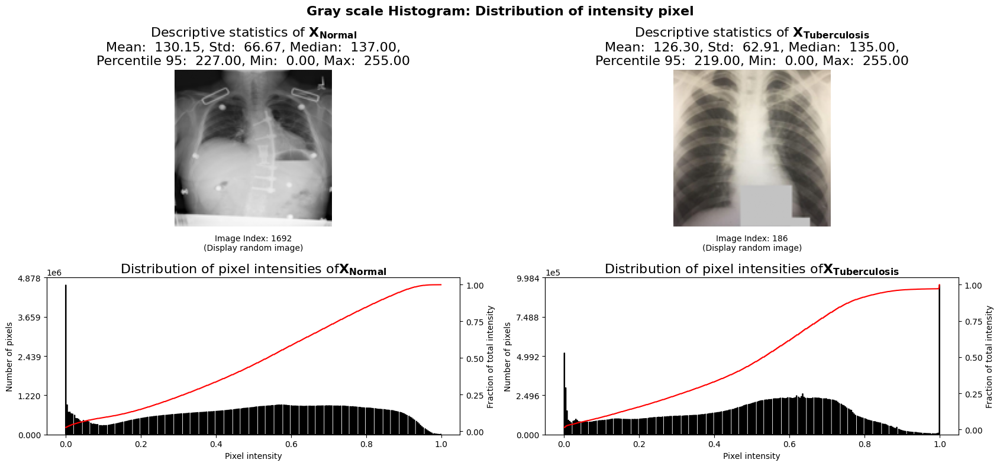

In [29]:
images = [x_norm, x_tb]
subsets = ['X_{Normal}', 'X_{Tuberculosis}']
# For visualization
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)

In [30]:
import cv2

In [31]:
def compute_image_statistics(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Compute image statistics
    mean_intensity = np.mean(gray)
    std_intensity = np.std(gray)
    median_intensity = np.median(gray)
    percentile_95 = np.percentile(gray, 95)

    return mean_intensity, std_intensity, median_intensity, percentile_95

def abnormal_image_identifier(images, labels, subset, thresholds):
    filtered_normal_images = []
    filtered_abnormal_images = []
    filtered_normal_labels = []
    filtered_abnormal_labels = []

    for image, label in zip(images, labels):
        # Compute image statistics
        mean_intensity, std_intensity, median_intensity, percentile_95 = compute_image_statistics(image)

        # Check if image meets filtering criteria
        if (mean_intensity > thresholds['mean_threshold'] and
            std_intensity > thresholds['std_threshold'] and
            median_intensity > thresholds['median_threshold'] and
            percentile_95 > thresholds['percentile_threshold']):
            # Image is abnormal
            filtered_abnormal_images.append(image)
            filtered_abnormal_labels.append(label)
        else:
            # Image is normal
            filtered_normal_images.append(image)
            filtered_normal_labels.append(label)

    summary = f"""{prefix_bold}Detected Abnormal Images{suffix_bold}
    Subset: {subset}
    Amount: {len(filtered_abnormal_images)} images
    """

    print(summary)

    return np.array(filtered_normal_images), np.array(filtered_abnormal_images), filtered_normal_labels, filtered_abnormal_labels

Tuberculosis constant threshold - detect abnormal image

In [32]:
constant = 5
tb_thresholds = {
    'mean_threshold': 126-constant,
    'std_threshold': 62-constant,
    'median_threshold': 135-constant,
    'percentile_threshold': 219-constant
}

# Filter images based on thresholds
norm_tb_images, abnorm_tb_images,norm_tb_labels, abnorm_tb_labels  = abnormal_image_identifier(x_tb, y_tb, subset='Tuberculosis', thresholds=tb_thresholds)

Detected Abnormal Images
    Subset: Tuberculosis
    Amount: 67 images
    


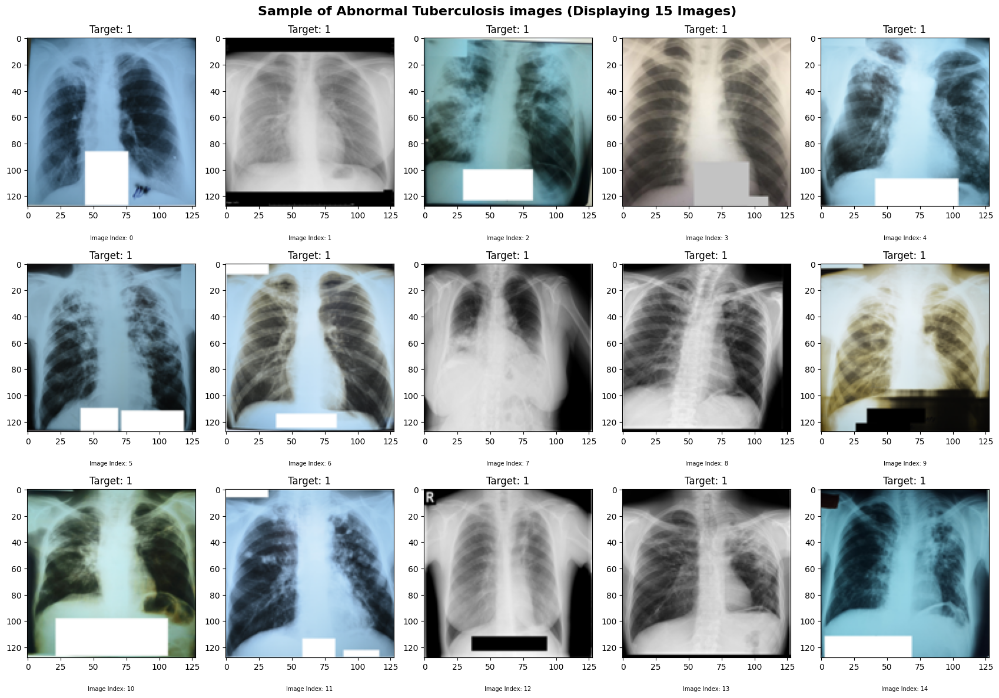

In [34]:
show_image(images=abnorm_tb_images,
           target=abnorm_tb_labels,
           title='Sample of Abnormal Tuberculosis images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=False)

Detect Abnormal Normal Images

In [35]:
constant = 5

norm_thresholds = {
    'mean_threshold': 130 + constant,
    'std_threshold': 66 + constant,
    'median_threshold': 137 +constant,
    'percentile_threshold': 227 +constant
}

# Filter images based on thresholds
norm_norm_images, abnorm_norm_images,norm_norm_labels, abnorm_norm_labels  = abnormal_image_identifier(x_norm, y_norm, subset='Normal', thresholds=norm_thresholds)

Detected Abnormal Images
    Subset: Normal
    Amount: 77 images
    


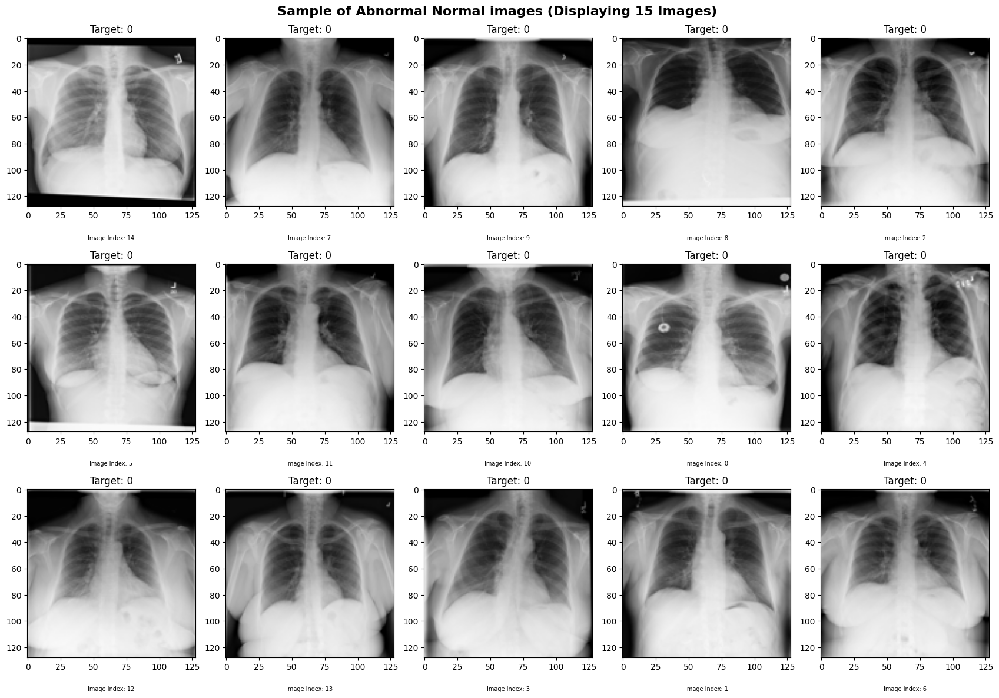

In [36]:
show_image(images=abnorm_norm_images,
           target=abnorm_norm_labels,
           title='Sample of Abnormal Normal images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=True)

Remove Background

In [37]:
def cv2_gray_converter(image):
    if len(image.shape) == 3:  # RGB image
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:  # Grayscale image
        gray = image
    return gray

RBS Function: Akan mendeteksi suatu gambar apakah hitam/putih bergantung pada range dari intensitasnya

In [38]:
def RBS(image,
        new_size=(128, 128),
        init_intensity=240,
        final_intensity=255):
    # 1. Condition: To convert the image to grayscale
    gray = cv2_gray_converter(image)
    # 2. calculate threshold
    info = f"Intensity Range: {init_intensity} to {final_intensity}"
    # 3. thresholding:
    ret, thresh = cv2.threshold(gray, init_intensity, final_intensity, cv2.THRESH_BINARY_INV)
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
    contour = max(contours, key=cv2.contourArea)

    # Find the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    # Crop the original image using the bounding box
    cropped_image = image[y:y+h, x:x+w]
    cropped_image = cv2.resize(cropped_image, new_size)

    return cropped_image, thresh, info

 DCS (Detect and Crop Subject): fungsi ini akan mendeteksi input gambar yang abu-abu warnanya

In [39]:
def DCS(image,
        padding=0,
        init_intensity=10,
        final_intensity=255,
        new_size=(128, 128)):

    # Convert the image to grayscale
    gray = cv2_gray_converter(image)

    # Apply thresholding to segment the subject (you can use more sophisticated segmentation techniques here)
    ret, thresh = cv2.threshold(gray, init_intensity, final_intensity, cv2.THRESH_BINARY)

    # Find contours
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
    contour = max(contours, key=cv2.contourArea)

    # Find the bounding box of the contour
    x, y, w, h = cv2.boundingRect(contour)

    # Draw a rectangle around the detected contour
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)  # Bounding box with Red color

    # Crop the subject with padding
    cropped_image = image[max(y - padding if (y - padding) > 0 else 0, 0):min((y + h + padding) if (y + h + padding) > 0 else 0, image.shape[0]),
                         max(x - padding if (x - padding) > 0 else 0, 0):min(x + w + padding if (x + w + padding) else 0, image.shape[1])]
    cropped_image = cv2.resize(cropped_image, new_size)

    return cropped_image

In [40]:
def display_after_remove(images,
                         targets,
                         subset,
                         dcs_init_intensity,
                         dcs_final_intensity,
                         rbs_init_intensity,
                         rbs_final_intensity,
                         padding,

                         new_size=(128, 128),
                         num_display=5,
                         title='Image cropping',
                         random_mode=False):
    cropped_images = []

    if random_mode:
        display_indices = np.random.choice(len(images), num_display, replace=False)
    else:
        display_indices = range(min(num_display, len(images)))
    # Image Processing and Achieve cropped images and targets or labels

    """
    Intensity Variables Declaration
    """
    # Black Intensity Range
    init_black_intensity = 10
    final_black_intensity = 255
    # White Intensity Range
    init_white_intensity = 214
    final_white_intensity = 255

    for image in images:

        # Detect and Crop Subject
        detected_image = DCS(image,
                             padding=padding,
                             init_intensity=init_black_intensity,
                             final_intensity=final_black_intensity,
                             new_size=new_size)

        # Remove white
        cropped_image, thresh, info = RBS(detected_image,
                                                         new_size=new_size,
                                                         init_intensity=init_white_intensity,
                                                         final_intensity=final_white_intensity,
                                                         )
        cropped_images.append(cropped_image)

    # Image Visualization: helps visualize the regions that will be cropped.
    for idx in display_indices:
        uncropped_image = images[idx]
        label = targets[idx]


        # Detect and Crop Subject
        detected_image = DCS(uncropped_image,
                             padding=padding,
                             init_intensity=init_black_intensity,
                             final_intensity=final_black_intensity,
                             new_size=new_size)

        # Remove white
        cropped_image, thresh, info = RBS(detected_image,
                                                         new_size=new_size,
                                                         init_intensity=init_white_intensity,
                                                         final_intensity=final_white_intensity,
                                                         )
        prefix_bold = r'$\bf{'
        suffix_bold = '}$'

        uncropped_title = f"""
            Mode: {Image.fromarray(uncropped_image).mode},
            Size: {Image.fromarray(uncropped_image).size}
            """
        cropped_title = f"""
            Mode: {Image.fromarray(cropped_image).mode},
            Size: {Image.fromarray(cropped_image).size}
            """
        plt.figure(figsize=(12, 6))
        plt.rcParams['axes.titlesize'] = 7

        plt.subplot(1, 4, 1)
        plt.imshow(uncropped_image)
        plt.title(f'{prefix_bold}Input{suffix_bold}: Original Image' + '\n' + uncropped_title, loc='left')

        plt.subplot(1, 4, 2)
        plt.imshow(detected_image)
        plt.title(f'{prefix_bold}Subject-Detection{suffix_bold}\nDetected Subject on Image: \nThreshold + Contours,\nCropping + ({padding}) Padding ')

        plt.subplot(1, 4, 3)
        plt.imshow(thresh, cmap='RdYlGn')
        plt.title(f"{prefix_bold}Threshold-Image{suffix_bold}\n{info}", fontsize=7)

        plt.subplot(1, 4, 4)
        plt.imshow(cropped_image)
        plt.title(f'{prefix_bold}Output{suffix_bold}: Cropped Image' + '\n' + cropped_title, loc='left')

        plt.suptitle(title + f"\n{prefix_bold}Subset{suffix_bold}: {subset}", font='bold')
        plt.show()

    return np.array(cropped_images), targets

In [41]:
tb_thresholds

{'mean_threshold': 121,
 'std_threshold': 57,
 'median_threshold': 130,
 'percentile_threshold': 214}

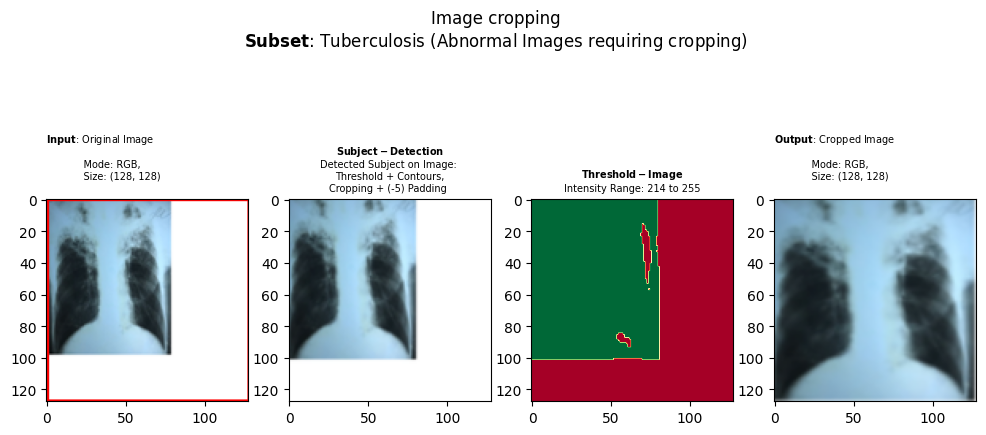

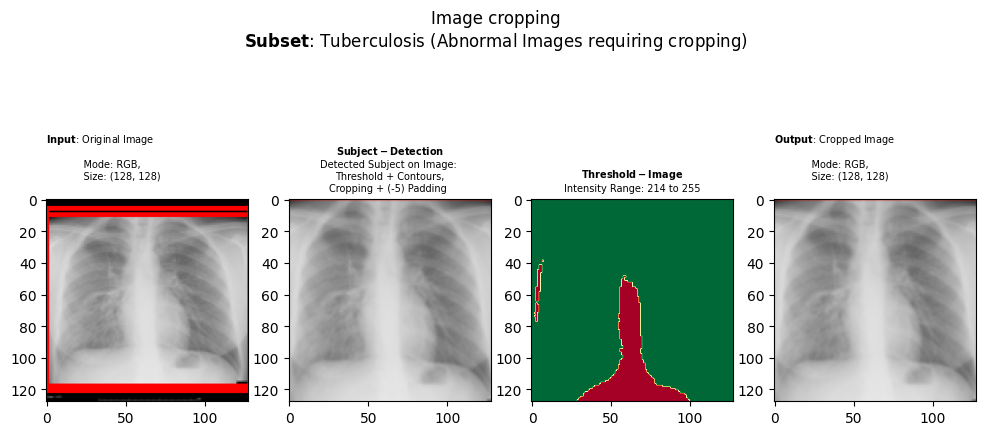

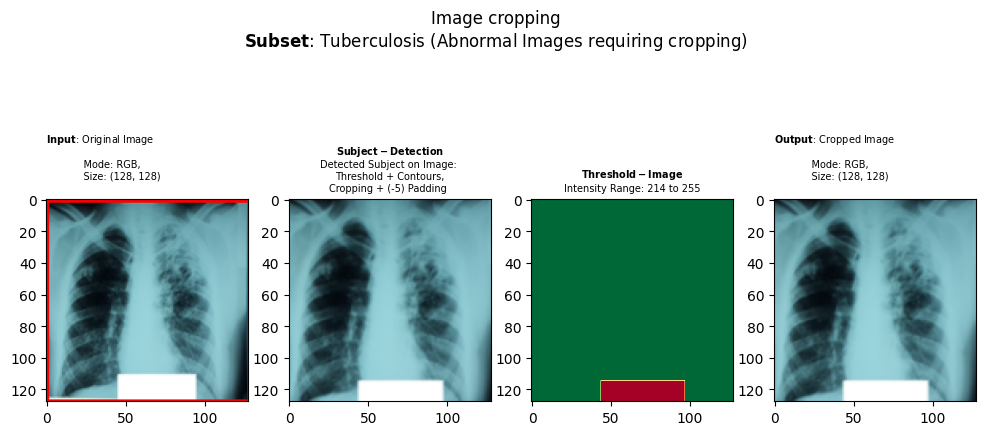

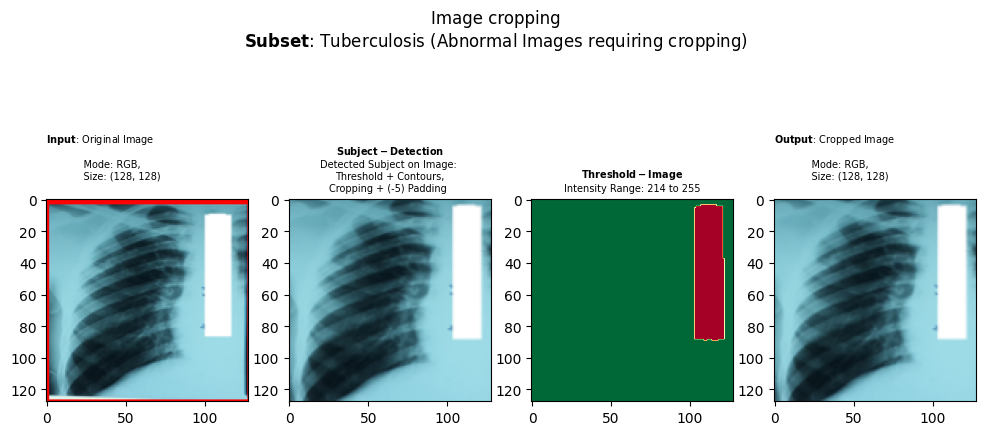

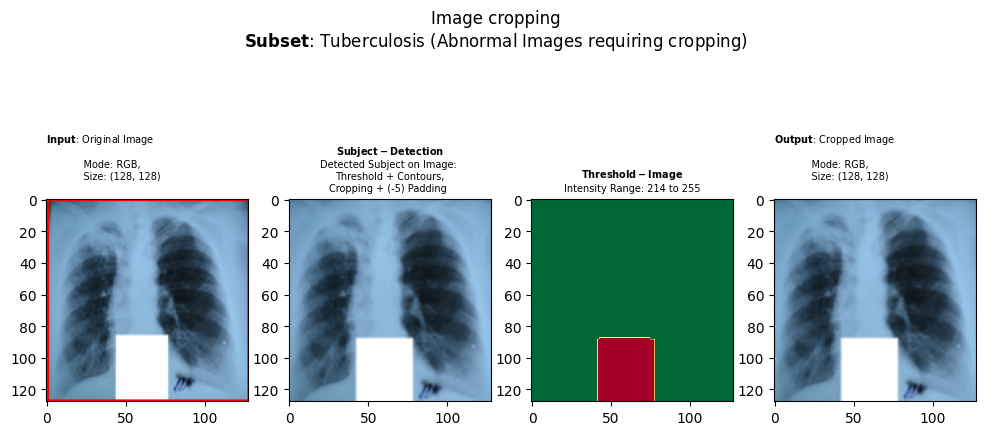

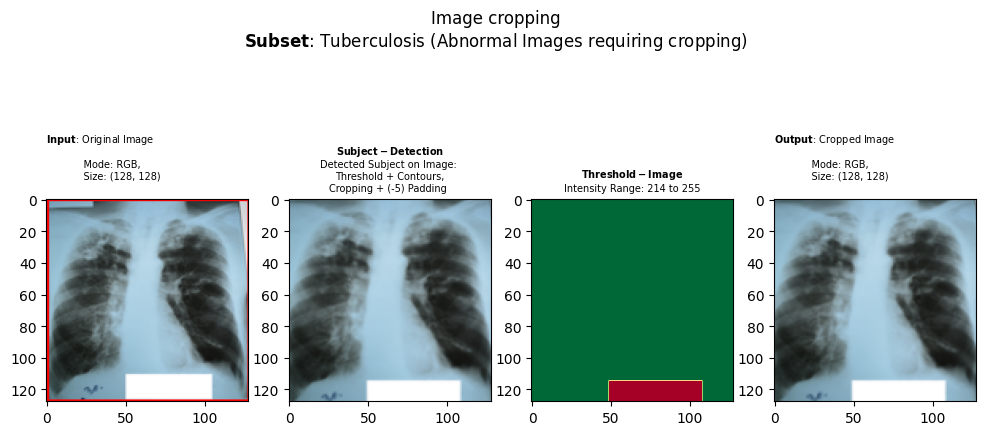

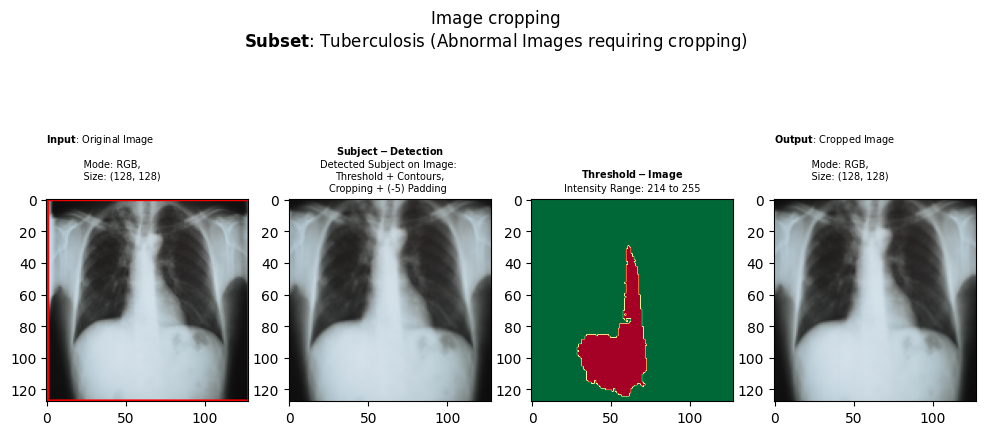

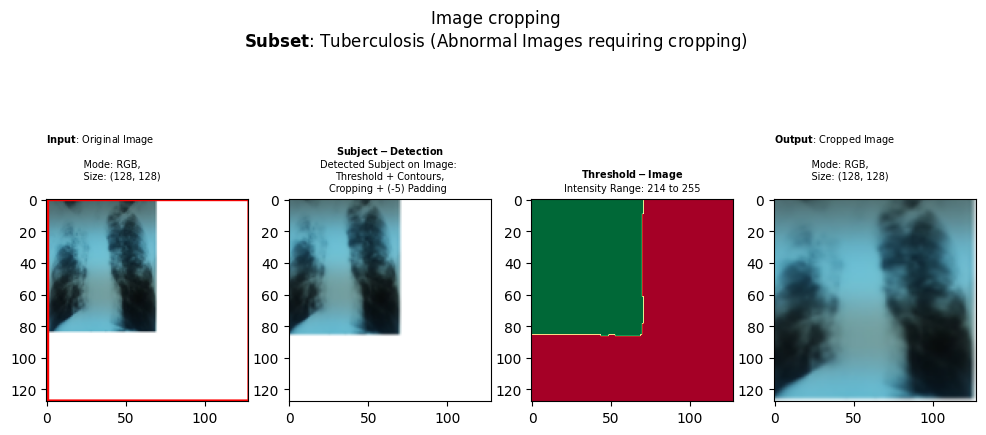

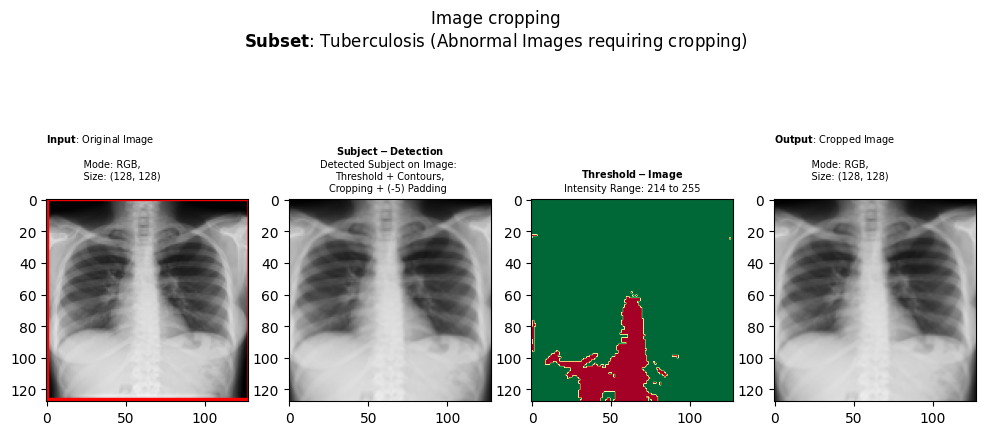

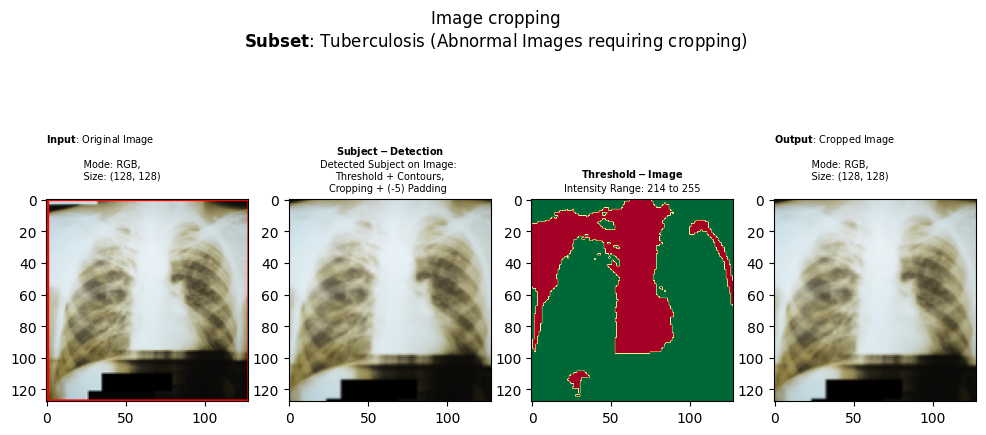

In [42]:
tb_cropped_images, tb_cropped_labels = display_after_remove(images=abnorm_tb_images,
                                              targets=abnorm_tb_labels,
                                              subset="Tuberculosis (Abnormal Images requiring cropping)",
                                              dcs_init_intensity=10,
                                              dcs_final_intensity=255,
                                              rbs_init_intensity=tb_thresholds['percentile_threshold'],
                                              rbs_final_intensity=255,
                                              padding=-5,
                                              new_size=(128, 128),
                                              num_display=10,
                                              title='Image cropping',
                                              random_mode=True)

In [43]:
tb_cropped_images.shape

(67, 128, 128, 3)

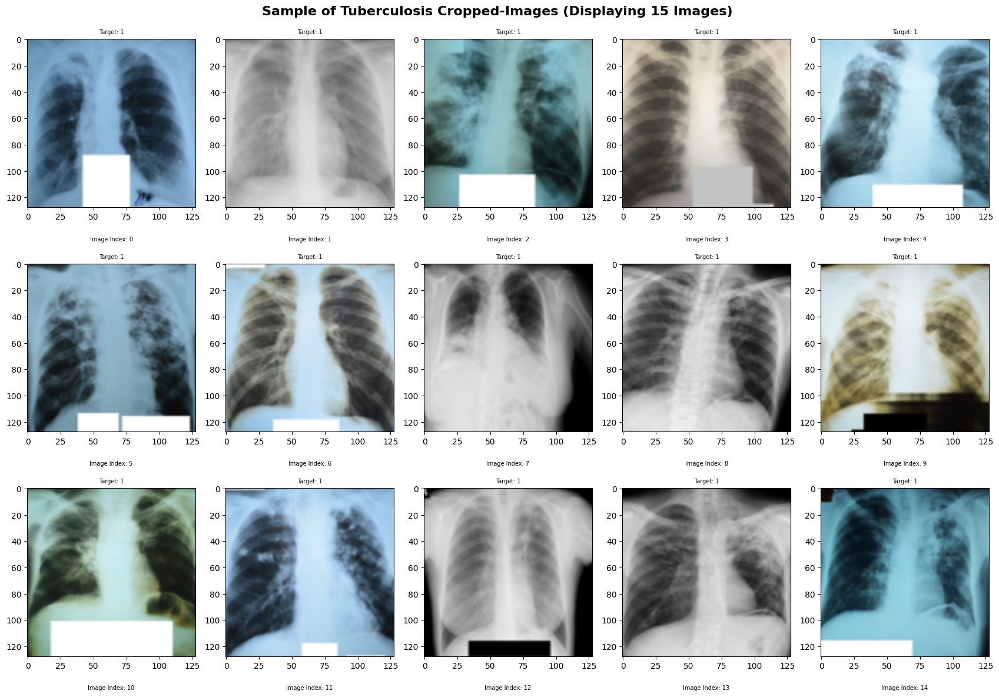

In [44]:
show_image(images=tb_cropped_images,
           target=tb_cropped_labels,
           title='Sample of Tuberculosis Cropped-Images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=False)

Data Preparation

In [45]:
# Concatenate
X_tb = np.concatenate((norm_tb_images, tb_cropped_images), axis=0)

# Concatenate
y_tb = np.concatenate((norm_tb_labels, tb_cropped_labels), axis=0)

In [46]:
X_tb.shape

(699, 128, 128, 3)

In [47]:
y_tb.shape

(699,)

Sebelum tahap ini, ada alternatif untuk menyeimbangkan jumlah data dengan augment data yang lebih sedikit (contoh di sini, membuat data tb yang 700 ditambah jadi 3500 agar setara dengan data normal, dengan cara seperti merotasi gambar dan translasi

Tapi untuk proyek ini, supaya lebih sesuai kenyataan (memang yang berpenyakit lebih sedikit jumlahnya daripada yang normal), jadi saya tetap pakai jumlah data tb apa adanya, 700 (imbalanced)

In [48]:
# Concatenate x_norm and x_tb along the first axis (samples)
X_imbalanced = np.concatenate((x_norm, X_tb), axis=0)

# Concatenate y_norm and target_tb
y_imbalanced = np.concatenate((y_norm,  y_tb), axis=0)

In [49]:
X_imbalanced.shape

(4199, 128, 128, 3)

In [50]:
y_imbalanced.shape

(4199,)

In [51]:
np.bincount(y_imbalanced)

array([3500,  699])

In [52]:
def Undersampling(x_majority, y_majority, x_minority, y_minority, replacement=False):
    # Determine the size of the minority class
    num_samples_minority = len(y_minority)

    # Randomly select a subset of samples from the majority class to match the size of the minority class
    selected_indices_majority = np.random.choice(np.arange(len(y_majority)), size=num_samples_minority, replace=replacement)

    # Undersampled majority class data
    x_majority_resampled = x_majority[selected_indices_majority]
    y_majority_resampled = y_majority[selected_indices_majority]

    # Combine
    x_resampled = np.concatenate((x_majority_resampled, x_minority))
    y_resampled = np.concatenate((y_majority_resampled, y_minority))

    return x_resampled, y_resampled

In [53]:
X_norm_undersampled, y_norm_undersampled = Undersampling(x_norm, y_norm, x_tb, y_tb)

In [54]:
# Print the shapes of the undersampled data
print("Undersampled x_norm shape:", X_norm_undersampled.shape)
print("Undersampled y_norm shape:", y_norm_undersampled.shape)

Undersampled x_norm shape: (1398, 128, 128, 3)
Undersampled y_norm shape: (1398,)


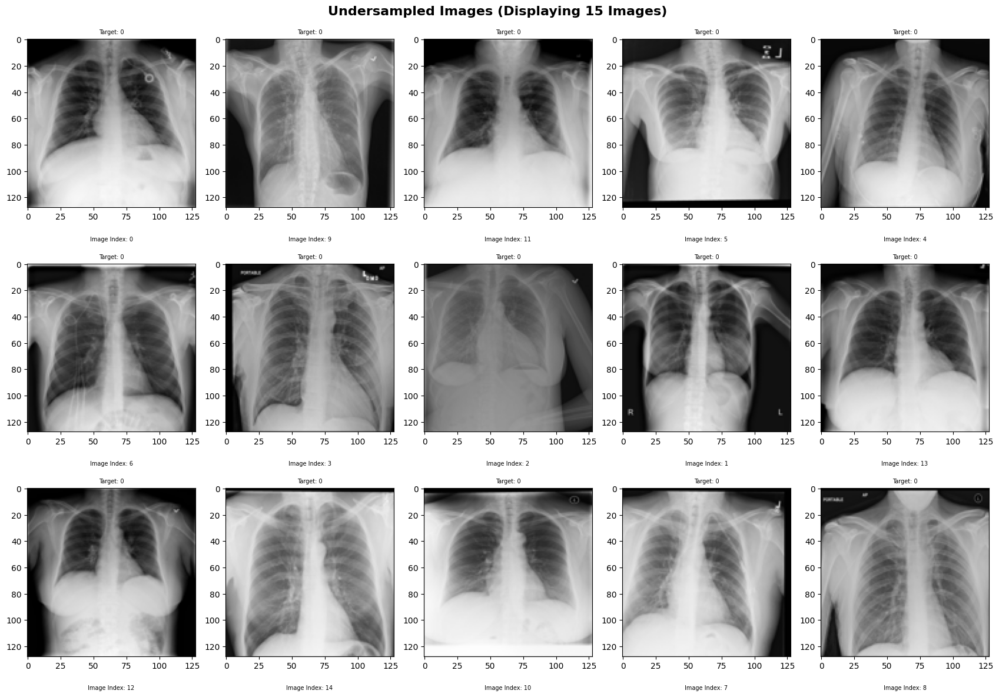

In [55]:
show_image(images=X_norm_undersampled,
           target=y_norm_undersampled,
           title='Undersampled Images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=True)

Image Enhancement:untuk meningkatkan kualitas visual dan menaikkan detail dalam gambar, sehingga identifikasi fitur dalam gambar yang dilakukan bisa lebih maksimal

In [56]:
from skimage import exposure

In [57]:
def contrast_stretching(X):
    p2, p98 = np.percentile(X, (2, 98))
    stretched_img = exposure.rescale_intensity(X, in_range=(p2, p98))
    return stretched_img

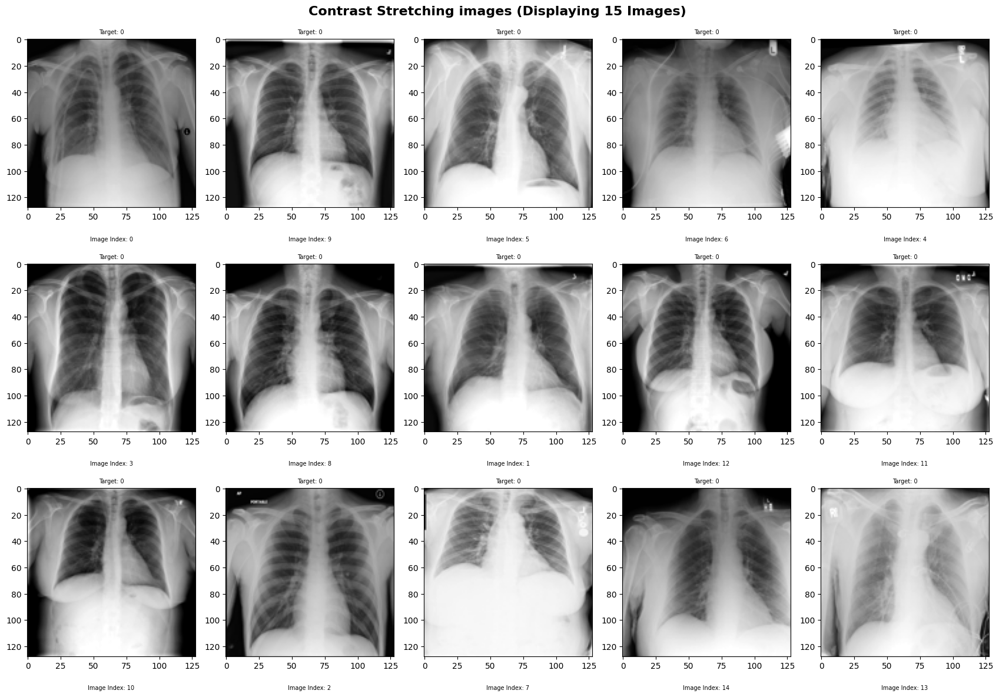

In [59]:
X_stretched = contrast_stretching(X_imbalanced[0:16])
y_stretched = y_imbalanced[0:16]
show_image(images=X_stretched,
           target=y_stretched,
           title='Contrast Stretching images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=True)

Histogram Equalization, untuk meningkatkan kontras secara menyeluruh dan meningkatkan distribusi brightness dalam gambar

In [60]:
def equalization(X):
    eq_img = exposure.equalize_hist(X)
    return eq_img

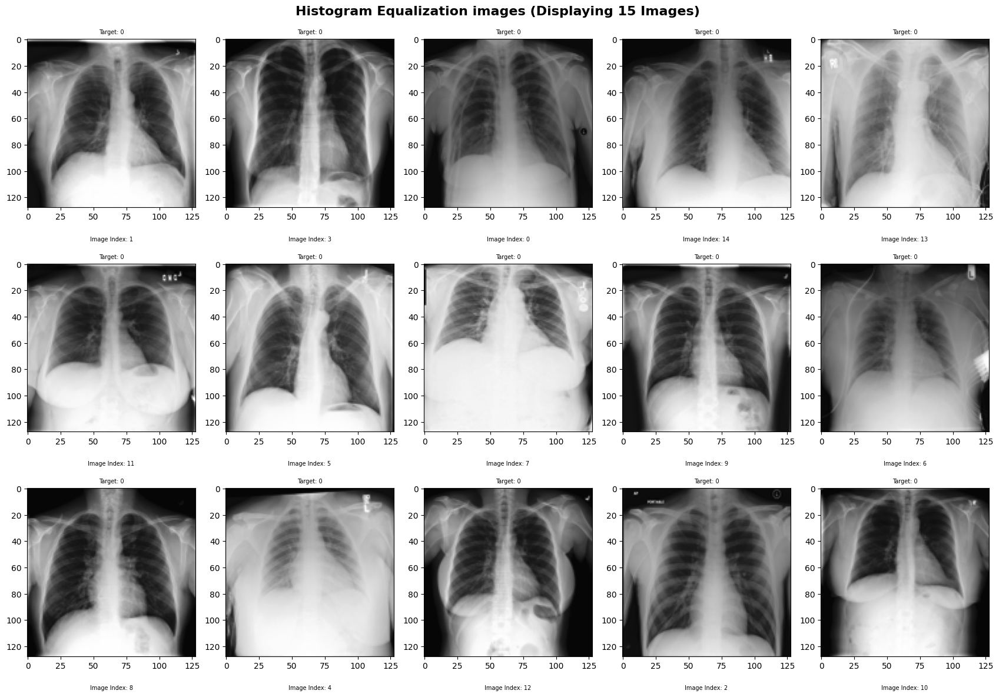

In [62]:
X_eq = equalization(X_imbalanced[0:16])
y_eq = y_imbalanced[0:16]
show_image(images=X_eq,
           target=y_eq,
           title='Histogram Equalization images',
           num_display=15,
           num_cols=5,
           cmap='gray',
           random_mode=True)

Adaptive Histogram Equalization: meningkatkan kontras tapi tetap mempertahankan detail lokal di dalam gambar

In [63]:
def adaptive_equalization(X, clip_limit, batch_size=None):
    if batch_size is None:
        # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization
        X_normalized = (X - np.min(X)) / (np.max(X) - np.min(X))
        X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
        adapteq_img = exposure.equalize_adapthist(
            X_normalized, clip_limit=clip_limit)
    else:
        # Process data in batches
        num_batches = int(np.ceil(len(X) / batch_size))
        batch_results = []

        for i in tqdm(range(num_batches),desc='processing...'):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(X))

            # Normalize the input image to the range of -1 to 1 and perform adaptive histogram equalization for each batch
            X_normalized = (X[start_idx:end_idx] - np.min(X[start_idx:end_idx])) / \
                (np.max(X[start_idx:end_idx]) - np.min(X[start_idx:end_idx]))
            X_normalized = (X_normalized * 2) - 1  # Scale to -1 to 1
            adapteq_img_batch = exposure.equalize_adapthist(
                X_normalized, clip_limit=clip_limit)
            batch_results.append(adapteq_img_batch)

        # Concatenate the batch results
        adapteq_img = np.concatenate(batch_results, axis=0)

    return adapteq_img

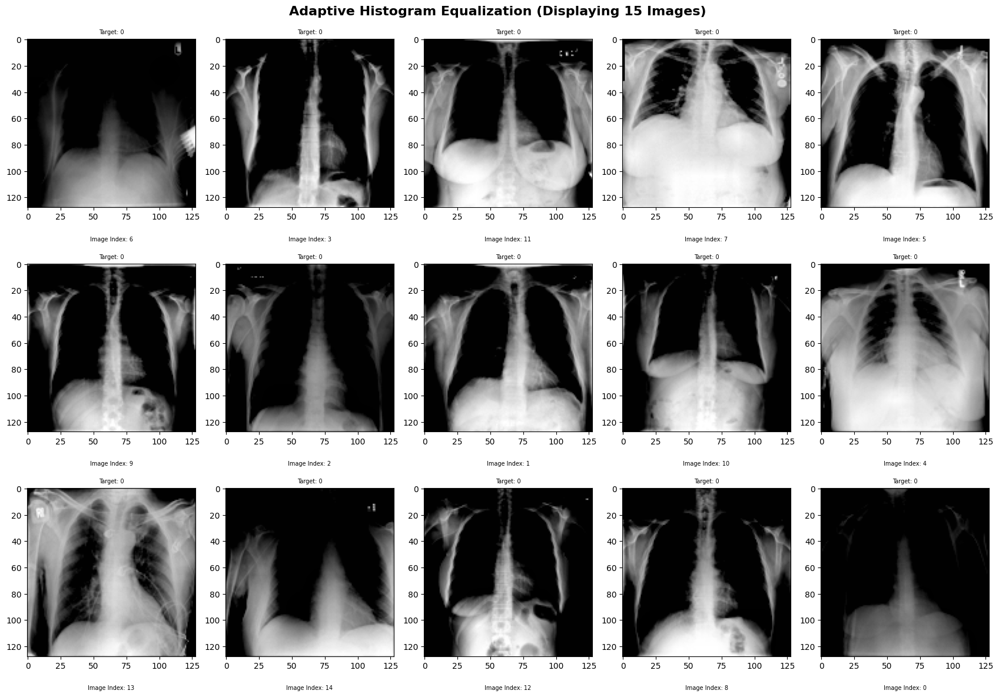

In [65]:
X_adapteq = adaptive_equalization(X_imbalanced[0:16], 0.01)
y_adapteq = y_imbalanced[0:16]
show_image(images=X_adapteq,
            target=y_adapteq,
            title='Adaptive Histogram Equalization',
            num_display=15,
            num_cols=5,
            cmap='gray',
            random_mode=True)

Summary of image enhancement

In [66]:
sample = X_imbalanced[0,:,:,:]
sample.shape

(128, 128, 3)

In [67]:
# 1. Load a normal image
img = sample

# 2. Contrast stretching
img_cs = contrast_stretching(img)

# 3. Histogram Equalization
img_eq = equalization(img)

# 4. Adaptive Equalization
img_adapteq = adaptive_equalization(img, 0.01)

methods = ['Low contrast image', 'Contrast stretching',
           'Histogram equalization', 'Adaptive equalization']
images_3 = [img, img_cs, img_eq, img_adapteq]

/usr/local/lib/python3.10/dist-packages/skimage/_shared/utils.py:394: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


In [68]:
def img_and_hist_single_img(image, axes, bins=100):
    '''
    Plot an image along with its histogram and cumulative histogram.
    '''
    image = img_as_float(image)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(image, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    # ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(image, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

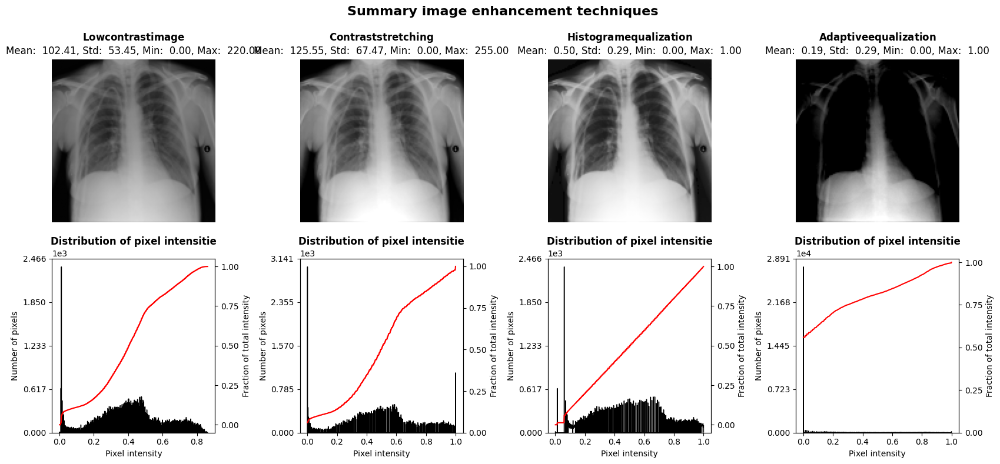

In [69]:
# Display results
fig, axes = plt.subplots(2, 4, figsize=(17, 8))

for i, (method, image) in enumerate(zip(methods, images_3)):
    ax_img, ax_hist, ax_cdf = img_and_hist_single_img(image, axes[:, i], bins=555)

    mean_value = np.mean(image)
    std_value = np.std(image)
    min_value = np.min(image)
    max_value = np.max(image)

    ax_img.set_title(
        r'$\bf{' + f'{method}'+'}$'+f'\nMean: {mean_value: .2f}, Std: {std_value: .2f}, Min: {min_value: .2f}, Max: {max_value: .2f}', fontsize=12)

    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_title(
        'Distribution of pixel intensitie', fontsize=12, fontweight='bold')
    ax_hist.set_ylabel('Number of pixels')
    ax_hist.set_yticks(np.linspace(0, y_max, 5))

    ax_cdf.set_ylabel('Fraction of total intensity')
    ax_cdf.set_yticks(np.linspace(0, 1, 5))

plt.suptitle('Summary image enhancement techniques',
             fontsize=16, fontweight='bold')
fig.tight_layout()
plt.show()

#Convolutional Neural Network - CNN

In [70]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dropout, Dense
from sklearn.model_selection import KFold
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import accuracy_score

In [71]:
class CNN(BaseEstimator, ClassifierMixin):
    def __init__(self,
                 # CNN Architecture
                 input_shape=(128, 128, 3),
                 unit_multiplier=1.0,
                 # CNN Hyperparameters
                 conv_padding='same',
                 conv_kernel_size=(3, 3),
                 conv_stride=1,
                 pool_padding='same',
                 pool_kernel_size=(2, 2),
                 pool_stride=2,
                 dropout=0,
                 l1_lambda=None,
                 l2_lambda=None,
                 pooling_type='max',
                 # Adam Optimizer Configuration (Default)
                 learning_rate=0.001,
                 beta1=0.9,
                 beta2=0.999,
                 epsilon=1e-07,
                 # Training Configuration
                 batch_size=32,
                 epochs=10,
                 verbose=0,
                 metrics=['accuracy'],
                 ):

        self.input_shape = input_shape
        self.unit_multiplier = unit_multiplier
        self.conv_padding = conv_padding
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.pool_padding = pool_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.dropout = dropout
        self.l1_lambda = l1_lambda
        self.l2_lambda = l2_lambda
        self.pooling_type = pooling_type
        self.learning_rate=learning_rate
        self.beta1=beta1
        self.beta2=beta2
        self.epsilon=epsilon
        self.metrics = metrics
        self.batch_size=batch_size
        self.epochs = epochs
        self.verbose = verbose
        self.model = self.architecturize()

    def architecturize(self):
        reg_l1 = None
        reg_l2 = None

        if self.l1_lambda is not None:
            reg_l1 = tf.keras.regularizers.l1(self.l1_lambda)

        if self.l2_lambda is not None:
            reg_l2 = tf.keras.regularizers.l2(self.l2_lambda)

        model = Sequential()
        model.add(Conv2D(
            int(32 * self.unit_multiplier),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            activation='relu',
            kernel_regularizer=reg_l1,
            input_shape=self.input_shape))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(64 * self.unit_multiplier),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Conv2D(
            int(128 * self.unit_multiplier),
            self.conv_kernel_size,
            strides=self.conv_stride,
            padding=self.conv_padding,
            kernel_regularizer=reg_l2,
            activation='relu'))

        if self.pooling_type == 'max':
            model.add(MaxPooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        elif self.pooling_type == 'avg':
            model.add(AveragePooling2D(
                pool_size=self.pool_kernel_size,
                strides=self.pool_stride,
                padding=self.pool_padding))
        else:
            raise ValueError("Invalid pooling_type. Use 'max' or 'avg'.")

        model.add(Flatten())
        model.add(Dense(
            units=int(128 * self.unit_multiplier),
            activation='relu',
            kernel_regularizer=reg_l2))

        model.add(Dropout(self.dropout))
        model.add(Dense(units=1, activation='sigmoid'))

        # Adam Optimizer Algorithm
        self.optimizer = tf.keras.optimizers.Adam(
                learning_rate=self.learning_rate,
                beta_1= self.beta1,
                beta_2= self.beta2,
                epsilon=self.epsilon,
            )
        model.compile(loss='binary_crossentropy',
                      optimizer=self.optimizer,
                      metrics=self.metrics)

        return model

    def predict_(self, X, threshold=0.5):

        probabilities = self.model.predict(X, verbose=self.verbose)
        binary_predictions = (probabilities > threshold).astype("int32")
        return binary_predictions, probabilities

    def fit(self, X, y):
        self.model.fit(X, y, epochs=self.epochs, batch_size=self.batch_size, verbose=self.verbose)
        return self

    def predict(self, X):
        return self.model.predict(X)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

    def summary(self):
        self.model.summary()

    def cv(self, X, y, epochs=10, batch_size=16, cv=5, verbose=1):
        kf = KFold(n_splits=cv, shuffle=True)
        scores = []
        for train_index, test_index in kf.split(X):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]
            self.model.fit(X_train, y_train, epochs=epochs if epochs else self.epochs, batch_size=batch_size if batch_size else self.batch_size, verbose=verbose if verbose else self.verbose)
            _, accuracy = self.model.evaluate(X_test, y_test, verbose=self.verbose)
            scores.append(accuracy)
        return scores

    def train(self, X_train, y_train, X_val, y_val, epochs, batch_size):

        steps_per_epoch = len(X_train) // batch_size
        validation_steps = len(X_val) // batch_size

        history = self.model.fit(
            X_train, y_train,
            batch_size=batch_size,
            epochs=epochs,
            steps_per_epoch=steps_per_epoch,
            validation_steps=validation_steps,
            validation_data=(X_val, y_val),
            verbose=self.verbose,
        )
        return history

In [72]:
cnn = CNN(unit_multiplier=1,
          input_shape=(128,128,3))

In [73]:
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 64, 64, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 32, 32, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 16, 16, 128)       0

Splitting the Dataset,
80% for training,
10% for validation,
and 10% for testing.

In [74]:
from sklearn.model_selection import train_test_split

In [75]:
def viz_class_distribution(X, y, title, classe_labels, train_percent=0.8, val_percent=0.1, test_percent=0.1, show_plot=True):
    assert train_percent + val_percent + test_percent == 1.0, "Sum of train_percent, val_percent, and test_percent should be 1.0"

    # Convert y to integers
    y = y.astype(int)

    # Split the data
    X_train, X_temp, y_train, y_temp = train_test_split(
        X, y, test_size=val_percent + test_percent, random_state=42, stratify=y)

    test_size = test_percent / (val_percent + test_percent)
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=test_size, random_state=42, stratify=y_temp)
    if show_plot:
        # Create a subplot with 3 columns and 1 row
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))

        # List of subset names
        subset_names = ['Train', 'Test', 'Validation']
        n = len(X)

        # Iterate over subsets
        for i, subset in enumerate([(X_train, y_train), (X_test, y_test), (X_val, y_val)]):
            X_subset, y_subset = subset
            n_subset = len(y_subset)
            # Get the class counts
            class_counts = np.bincount(y_subset)

            # Plot histogram for the current subset
            axs[i].bar(classe_labels, class_counts, color='#AA99FF')
            subtitle = r'$\bf{' + subset_names[i] + \
                '}$' + f' {int(n_subset/n*100)} %'
            axs[i].set_title(
                subtitle + f'\n Size = {X_subset.shape[0]}', fontsize=18)
            axs[i].set_xlabel('Class')
            axs[i].set_ylabel('Number of examples')

            # Add labels to the bars
            for j, count in enumerate(class_counts):
                axs[i].text(j, count, str(count), ha='center',
                            va='bottom', fontsize=12)

        class_counts = np.bincount(y)
        class_balance_text = ' | '.join(
            [f'{class_label} ({count})' for class_label, count in zip(classe_labels, class_counts)])
        plt.suptitle(f'{title}' + f'\n Training examples (X): {X.shape[0]}' +
                     f'\nTarget (y): {class_balance_text}', fontsize=20)

        plt.tight_layout()
        plt.show()

    return X_train, y_train, X_test, y_test, X_val, y_val

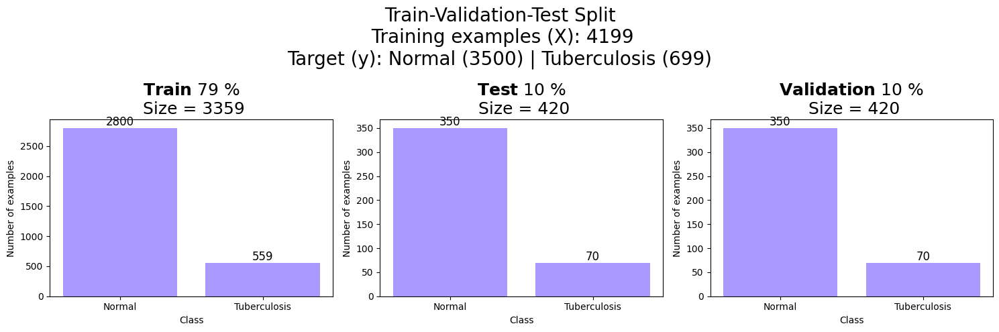

In [76]:
X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X_imbalanced,
                        y=y_imbalanced,
                        title='Train-Validation-Test Split',
                        classe_labels=['Normal', 'Tuberculosis'],
                        train_percent=0.8,
                        val_percent=0.1,
                        test_percent=0.1)

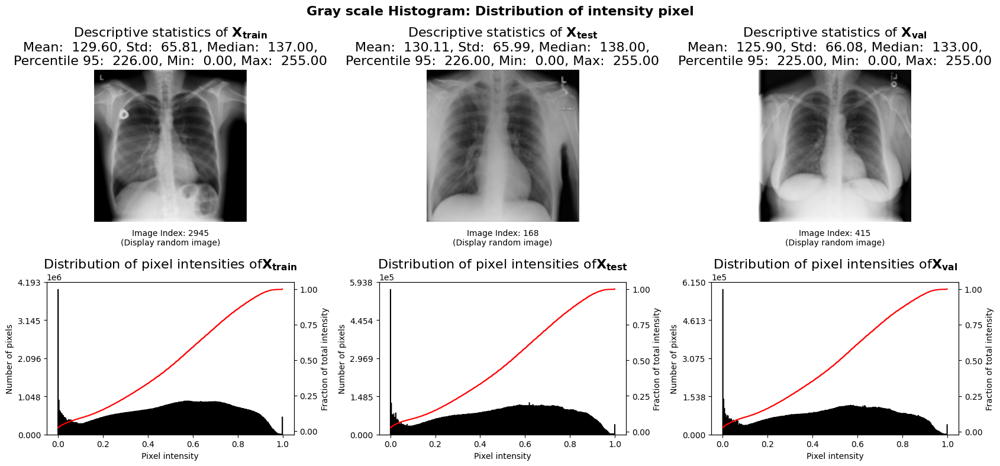

In [77]:
images = [X_train, X_test, X_val]
subsets = ['X_{train}', 'X_{test}', 'X_{val}']
# For visualization
plot_gray_scale_histogram(images=images, titles=subsets, bins=555)

Modeling, Learning Problem: Binary Classification

Baseline Peformance - tanpa mengaplikasikan teknik apapun ke dataset

In [79]:
epochs = 10
batch_size = 64
cnn1 = CNN(unit_multiplier=0.05,
          input_shape=(128,128,3))
cnn1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 128, 128, 1)       28        
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 1)         0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 3)         30        
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 32, 32, 3)         0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 32, 6)         168       
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 16, 16, 6)        

In [80]:
history = cnn1.train(X_train, y_train, X_val, y_val,
                   epochs=epochs,
                   batch_size=batch_size)

In [81]:
def plot_history(history):
    # Accuracy
    plt.plot(history.history['accuracy'], c = 'royalblue', linewidth = 2.5, label = 'Training')
    plt.plot(history.history['val_accuracy'], c = 'firebrick', linestyle = '--', label = 'Valid')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left', frameon = True, facecolor = 'white')
    plt.show()

    # Loss
    plt.plot(history.history['loss'], c = 'royalblue', linewidth = 2.5, label = 'Training')
    plt.plot(history.history['val_loss'], c = 'firebrick', linestyle = '--', label = 'Valid')
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left',frameon = True, facecolor = 'white')
    plt.show()

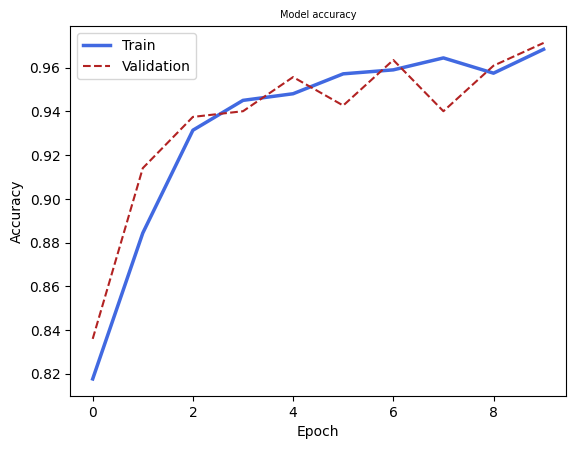

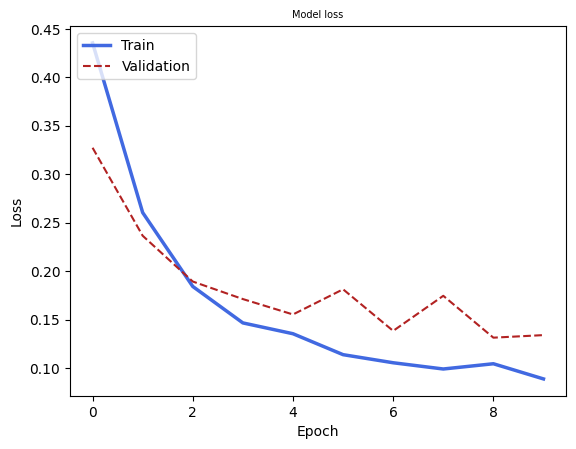

In [82]:
plot_history(history)

In [83]:
import json
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, accuracy_score, roc_curve, roc_auc_score, f1_score, auc

In [84]:
def evaluate(estimator, estimator_tag, experiment_tag, X_train, y_train, X_test, y_test, X_val, y_val):
    subsets = {'Train': (X_train, y_train), 'Test': (X_test, y_test), 'Validation': (X_val, y_val)}
    performances = []
    for subset_name, (X_subset, y_actual) in subsets.items():
        # Model Prediction/Y hat
        # y_pred_binary_predictions, y_probabilities

        y_pred, y_prob = estimator.predict_(X_subset)

        # Calculate ROC curve and AUC score
        fpr, tpr, thresholds = roc_curve(y_actual, y_prob)
        auc_score = auc(fpr, tpr)

        # Classification Report
        report = classification_report(y_actual, y_pred, output_dict=True)
        report_dict = json.loads(json.dumps(report))

        # Extract precision and recall from report_dict
        precision = report_dict['weighted avg']['precision']
        recall = report_dict['weighted avg']['recall']
        accuracy = report_dict['accuracy']
        f1_score = report_dict['weighted avg']['f1-score']

        # Confusion Matrix
        cm = confusion_matrix(y_actual, y_pred)
        TP = cm[0][0]
        FP = cm[0][1]
        FN = cm[1][0]
        TN = cm[1][1]

        sensitivity = TP / (TP + FN)  # Sensitivity or True Positive Rate
        specificity = TN / (TN + FP)  # Specificity or True Negative Rate

        performance = {
            'Model': estimator_tag,
            'Experiment_tag':experiment_tag,
            'Subset': subset_name,
            'FPR':fpr,
            'TPR':tpr,
            'TP': TP,
            'FP': FP,
            'FN': FN,
            'TN': TN,
            'Precision': precision,
            'Recall': recall,
            'Sensitivity': sensitivity,
            'Specificity': specificity,
            'F1 Score': f1_score,
            'AUC': auc_score,
            'Accuracy': accuracy,
        }

        performances.append(performance)

    return pd.DataFrame(performances)

In [85]:
evaluation_1 = evaluate(cnn1,
                        'CNN_1_Baseline',
                        'A',
                        X_train,
                        y_train,
                        X_test,
                        y_test,
                        X_val,
                        y_val)

In [86]:
evaluation_1

,Model,Experiment_tag,Subset,FPR,TPR,TP,FP,FN,TN,Precision,Recall,Sensitivity,Specificity,F1 Score,AUC,Accuracy
0,CNN_1_Baseline,A,Train,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.0, 0.008944543828264758, 0.0178890876565295...",2776,24,54,505,0.976544,0.976779,0.980919,0.954631,0.976521,0.993540,0.976779
1,CNN_1_Baseline,A,Test,"[0.0, 0.0, 0.002857142857142857, 0.00285714285...","[0.0, 0.014285714285714285, 0.0142857142857142...",342,8,14,56,0.946395,0.947619,0.960674,0.875000,0.946669,0.975796,0.947619
2,CNN_1_Baseline,A,Validation,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.002857142857142857...","[0.0, 0.014285714285714285, 0.2714285714285714...",347,3,9,61,0.971120,0.971429,0.974719,0.953125,0.970910,0.973878,0.971429


In [87]:
def plot_confusion_matrix(estimator,X,  y, subset_name):
    y_pred, y_prob = estimator.predict_(X)

    cm = confusion_matrix(y, y_pred)
    labels = ['Negative', 'Positive']

    # Extract TP, TN, FP, FN
    tn, fp, fn, tp = cm.ravel()
    sensitivity = tp / (tp + fn)  # Sensitivity or True Positive Rate
    specificity = tn / (tn + fp)  # Specificity or True Negative Rate

    plt.figure(figsize=(18, 9))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=labels, yticklabels=labels)



    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {subset_name}\n'
              f'True Positives: {tp} | True Negatives: {tn}\n'
              f'False Positives: {fp} (Type I error) | False Negatives: {fn} (Type II error)\n'
              f'Sensitivity (True Positive Rate): {sensitivity:.4f} | Specificity (True Negative Rate): {specificity:.4f}',
              loc='center', wrap=True)
    plt.show()

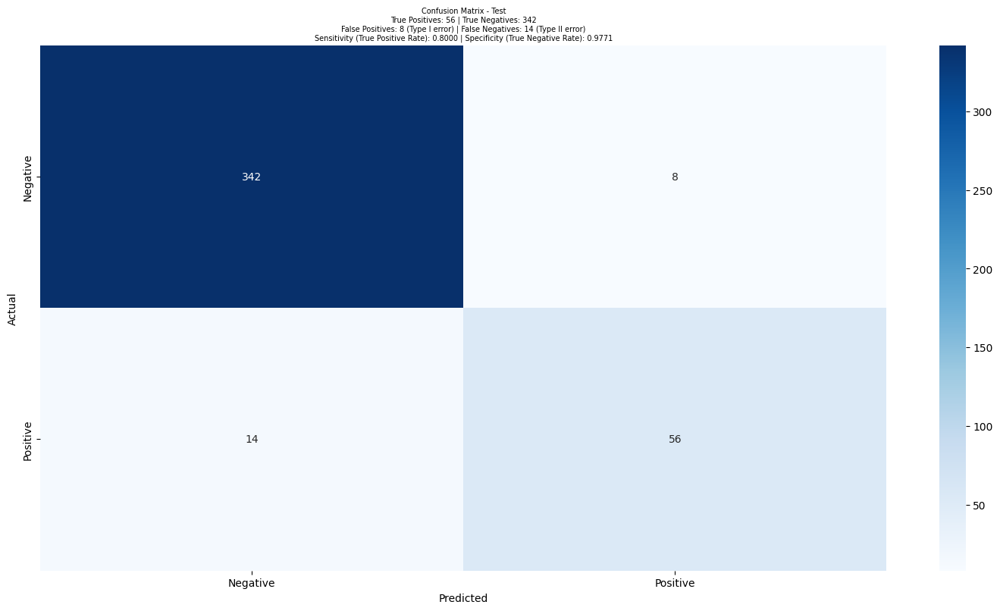

In [88]:
plot_confusion_matrix(estimator=cnn1,
                      X=X_test,
                      y=y_test,
                      subset_name='Test')

Model dengan Image Enhancement

Contrast Stretching

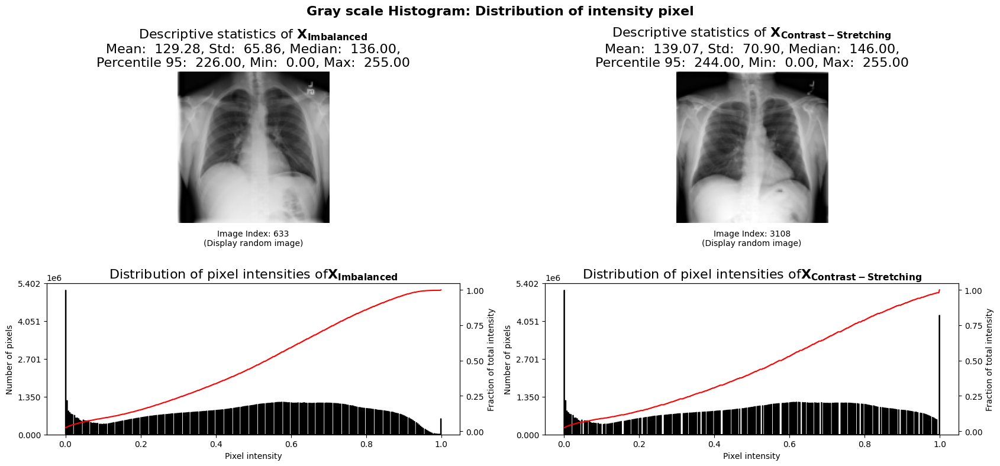

In [89]:
X_stretched = contrast_stretching(X_imbalanced)
images = [X_imbalanced, X_stretched]
subsets = ['X_{Imbalanced}', 'X_{Contrast-Stretching}']
# For visualization
plot_gray_scale_histogram(images=images,
                          titles=subsets,
                          bins=555)

In [90]:
X_train, y_train, X_test, y_test, X_val, y_val = viz_class_distribution(X=X_stretched,
    y=y_imbalanced,
    title='Class Distribution in Train-Validation-Test Split (X_stretched)',
    classe_labels=['Normal', 'Tuberculosis'],
    train_percent=0.8,
    val_percent=0.1,
    test_percent=0.1,
                                                                        show_plot=False)

In [91]:
cnn2 = CNN(unit_multiplier=0.05,
        input_shape=(128,128,3))
cnn2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 128, 128, 1)       28        
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 64, 64, 1)         0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 64, 64, 3)         30        
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 32, 32, 3)         0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 6)         168       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 16, 16, 6)        

In [92]:
history2 = cnn2.train(X_train, y_train, X_val, y_val,
                        epochs=epochs,
                        batch_size=batch_size)

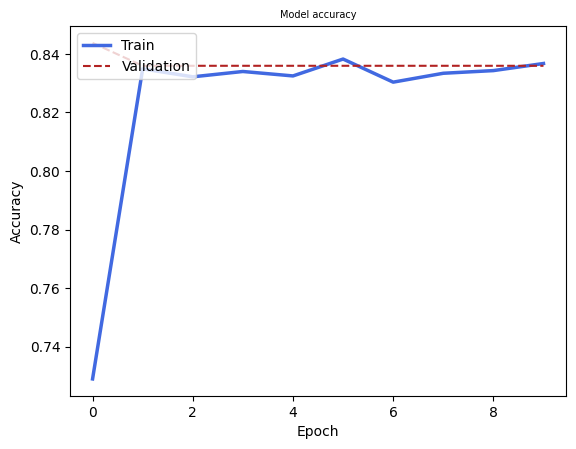

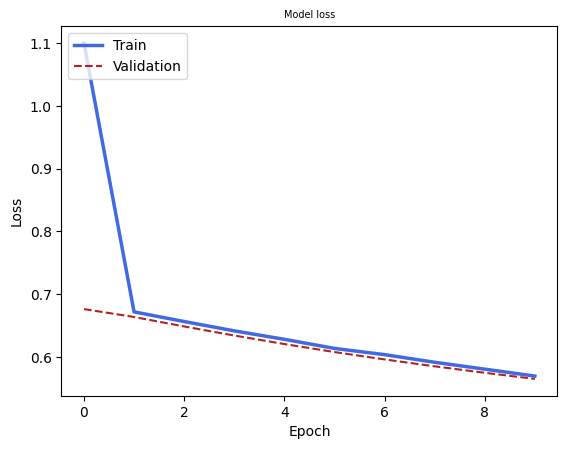

In [93]:
plot_history(history2)

Terlihat disini kalau akurasi model tercapai lebih cepat tahap melandainya daripada baseline yang sebelumnya (hasil tanpa teknik apapun ke dataset)

In [94]:
evaluation_2 = evaluate(cnn2,
                    'CNN_2_Contrast-Stretching',
                    'E',
                    X_train,
                    y_train,
                    X_test,
                    y_test,
                    X_val,
                    y_val)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
<ipython-input-84-f07d2b71576a>:32: RuntimeWarning: invalid valu

In [95]:
evaluation_2

,Model,Experiment_tag,Subset,FPR,TPR,TP,FP,FN,TN,Precision,Recall,Sensitivity,Specificity,F1 Score,AUC,Accuracy
0,CNN_2_Contrast-Stretching,E,Train,"[0.0, 1.0]","[0.0, 1.0]",2800,0,559,0,0.694858,0.833581,0.833581,NaN,0.757924,0.5,0.833581
1,CNN_2_Contrast-Stretching,E,Test,"[0.0, 1.0]","[0.0, 1.0]",350,0,70,0,0.694444,0.833333,0.833333,NaN,0.757576,0.5,0.833333
2,CNN_2_Contrast-Stretching,E,Validation,"[0.0, 1.0]","[0.0, 1.0]",350,0,70,0,0.694444,0.833333,0.833333,NaN,0.757576,0.5,0.833333


Terlihat bahwa ternyata akurasi menurun ketimbang baseline tadi, baseline di kisaran 93%, di contrast stretching ini sekitar 83%